<a href="https://colab.research.google.com/github/asimds/26DECOPFAIL/blob/main/Payments_working.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
df = pd.read_csv('/content/drive/MyDrive/26Dec21/filtered_payments.csv')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (3,4,14,22) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [2]:
#checking head of first part of dataframe
df.head()

,uuid,user_id,amount,comment,entity_id,entity_type,latitude,longitude,processed,created_at,billable_at,emi_duration,interest,squared_off,ip,lender_id,due_amount,settled_at,recon,recon_url,balance_principal,due_date,admin_user,present_in_elastic,commission
0,a286abe7-0bee-4e41-810d-5d3dc7488b5e,650644,-5000,NaN,45016dad-3d32-4a18-af4a-272482d1fa8c,emi,20.967899,86.076830,True,2021-12-21T19:14:33.719283+05:30,2022-05-28T05:30:00+05:30,0,0,False,NaN,11,-5000.0,NaN,False,NaN,-5000.0,2022-06-12T05:29:59+05:30,NaN,True,NaN
1,b8d115b0-b5a5-4043-bd6d-cdafd847d693,443070,-17000,NaN,f70608b2-b3d8-4256-ba0b-4ae6792df40f,emi,16.500881,80.642606,True,2021-12-01T10:15:09.680958+05:30,2022-05-28T05:30:00+05:30,0,0,False,NaN,12,-17000.0,NaN,False,NaN,-17000.0,2022-06-12T05:29:59+05:30,NaN,True,NaN
2,b12709dc-4a14-4b02-ab15-7ea91a3aac6e,652410,-13000,NaN,494a74cc-2227-4e15-92cc-9e4d6686b08f,emi,18.979068,73.029655,True,2021-12-28T10:47:13.630097+05:30,2022-05-28T05:30:00+05:30,0,0,False,NaN,11,-13000.0,NaN,False,NaN,-13000.0,2022-07-13T05:29:59+05:30,NaN,True,NaN
3,7a3e1e63-440f-4249-99aa-591186567e8b,490947,-18000,NaN,802ca487-8cb1-4dff-b698-29395e3f426e,emi,13.001183,80.016914,True,2021-12-01T21:48:33.256888+05:30,2022-05-28T05:30:00+05:30,0,0,False,NaN,12,-18000.0,NaN,False,NaN,-18000.0,2022-06-12T05:29:59+05:30,NaN,True,NaN
4,d0650eab-75bb-471e-9ad1-9673be3b4202,490986,-10000,NaN,c1ad955a-6bee-40ed-b009-a93ab3133208,emi,17.966533,74.991838,True,2021-12-18T07:53:29.761592+05:30,2022-05-28T05:30:00+05:30,0,0,False,NaN,9,-10000.0,NaN,False,NaN,-10000.0,2022-06-12T05:29:59+05:30,NaN,True,NaN


In [3]:
df.lender_id.nunique()

11

In [4]:
df.columns

Index(['uuid', 'user_id', 'amount', 'comment', 'entity_id', 'entity_type',
       'latitude', 'longitude', 'processed', 'created_at', 'billable_at',
       'emi_duration', 'interest', 'squared_off', 'ip', 'lender_id',
       'due_amount', 'settled_at', 'recon', 'recon_url', 'balance_principal',
       'due_date', 'admin_user', 'present_in_elastic', 'commission'],
      dtype='object')

In [5]:
#removing unnecessary columns
unnecessary = ['comment',  'ip', 'latitude', 'longitude','recon','squared_off',
           'recon_url','admin_user','created_at','present_in_elastic', 'commission']

df.drop(unnecessary,axis=1,inplace=True)

In [6]:
df.shape

(428410, 14)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 428410 entries, 0 to 428409
Data columns (total 14 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   uuid               428410 non-null  object 
 1   user_id            428410 non-null  int64  
 2   amount             428410 non-null  int64  
 3   entity_id          428382 non-null  object 
 4   entity_type        428410 non-null  object 
 5   processed          428410 non-null  bool   
 6   billable_at        428410 non-null  object 
 7   emi_duration       428410 non-null  int64  
 8   interest           428410 non-null  int64  
 9   lender_id          428410 non-null  int64  
 10  due_amount         423866 non-null  float64
 11  settled_at         216809 non-null  object 
 12  balance_principal  338540 non-null  float64
 13  due_date           428410 non-null  object 
dtypes: bool(1), float64(2), int64(5), object(6)
memory usage: 42.9+ MB


In [8]:
df.sort_values(by=['billable_at'], inplace=True, ascending=True)

In [9]:
df.head()

,uuid,user_id,amount,entity_id,entity_type,processed,billable_at,emi_duration,interest,lender_id,due_amount,settled_at,balance_principal,due_date
428409,0cb27550-bb66-4dff-b7dc-54874a5b97b5,39894,61,39894,cashback,True,0202-05-23T05:53:38+05:53:28,0,0,9,0.0,NaN,NaN,0202-05-23T05:53:38+05:53:28
428408,70e1c77a-65fc-4724-87d5-59cf372240d2,78776,6,78776,cashback,True,0202-05-23T05:53:38+05:53:28,0,0,9,0.0,NaN,NaN,0202-05-23T05:53:38+05:53:28
428407,6b21db52-8087-42a6-b169-de0d5f78170d,203966,6,203966,cashback,True,0202-05-23T05:53:38+05:53:28,0,0,9,0.0,NaN,NaN,0202-05-23T05:53:38+05:53:28
428406,55a5d774-5d73-49ea-8c6a-5084ed374a73,404581,28316,16959,sell_gold,True,1975-03-04T19:18:51.285+05:30,0,0,9,0.0,NaN,NaN,1975-03-04T19:18:51.285+05:30
428404,5d31cc3c-21da-49f7-a797-0034b4cb6262,386160,10,386160,cashback,True,2012-07-12T05:30:00+05:30,0,0,9,0.0,NaN,NaN,2012-07-12T05:30:00+05:30


In [10]:
df.tail()

,uuid,user_id,amount,entity_id,entity_type,processed,billable_at,emi_duration,interest,lender_id,due_amount,settled_at,balance_principal,due_date
37,6abc6b92-2332-475d-8fa5-ea4e336d2701,650644,-10000,a9b6c57f-4e77-40b6-a2e3-d539eadf0bff,emi,True,2022-05-28T05:30:00+05:30,0,0,11,-10000.0,NaN,-10000.0,2022-06-12T05:29:59+05:30
36,c94aa107-4e42-4a5e-b65e-145197024a05,654299,-8000,9aac31b3-9330-4ea4-bc9e-cc3d1d6b54f1,emi,True,2022-05-28T05:30:00+05:30,0,0,11,-8000.0,NaN,-8000.0,2022-06-12T05:29:59+05:30
35,b9068537-8716-463f-a281-87469e6ac289,476382,-13000,1ab0cd85-d75f-41a2-982f-8ca569c14e2d,emi,True,2022-05-28T05:30:00+05:30,0,0,11,-13000.0,NaN,-13000.0,2022-06-12T05:29:59+05:30
49,e190418c-f300-4a06-a0f7-6a8bf140508d,490986,-5000,b864607d-1560-457e-b4cb-bae2fe05c056,emi,True,2022-05-28T05:30:00+05:30,0,0,9,-5000.0,NaN,-5000.0,2022-06-12T05:29:59+05:30
0,a286abe7-0bee-4e41-810d-5d3dc7488b5e,650644,-5000,45016dad-3d32-4a18-af4a-272482d1fa8c,emi,True,2022-05-28T05:30:00+05:30,0,0,11,-5000.0,NaN,-5000.0,2022-06-12T05:29:59+05:30


In [11]:
pip install -U dataprep

     |████████████████████████████████| 3.5 MB 5.2 MB/s 
     |████████████████████████████████| 158 kB 62.5 MB/s 
     |████████████████████████████████| 366 kB 60.6 MB/s 
     |████████████████████████████████| 848 kB 56.2 MB/s 
     |████████████████████████████████| 10.9 MB 38.3 MB/s 
     |████████████████████████████████| 63 kB 2.4 MB/s 
     |████████████████████████████████| 1.5 MB 42.3 MB/s 
     |████████████████████████████████| 719 kB 42.1 MB/s 
     |████████████████████████████████| 943 kB 45.1 MB/s 
     |████████████████████████████████| 1.1 MB 47.9 MB/s 
     |████████████████████████████████| 192 kB 47.7 MB/s 
     |████████████████████████████████| 271 kB 51.5 MB/s 
     |████████████████████████████████| 160 kB 50.7 MB/s 
     |████████████████████████████████| 132 kB 49.3 MB/s 
     |████████████████████████████████| 49 kB 5.8 MB/s 
     |████████████████████████████████| 1.5 MB 43.8 MB/s 
     |████████████████████████████████| 1.5 MB 43.5 MB/s 
     |████████████

In [12]:
#saving dataframe
df.to_pickle('/content/drive/MyDrive/26Dec21/filtered_payments')

In [13]:
from dataprep.datasets import load_dataset
from dataprep.eda import create_report

NumExpr defaulting to 2 threads.


The plot will not show in a notebook environment, please try 'show_browser' if you want to open it in browser



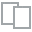
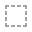
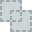
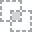
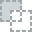
...
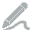
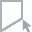
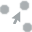
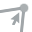
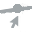

In [14]:
create_report(df).show()